## Characteristics of Annotated Abortion Tweets Data Set

#### Berra Karayel 0054477

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
annotated_abortion_tweets = pd.read_csv("/Users/berrakarayel/Desktop/abortion annotation.csv")
annotated_abortion_tweets.head(10)

,number,date,id,rawContent,label
0,1,2021-10-06 11:44:39+00:00,1.445717e+18,kürtaj konusunda kararım net. muhafazakarlarla...,positive
1,2,2013-03-30 08:12:17+00:00,3.179122e+17,@LilaGraceRose neden kürtaj ve son çaremi,neutral
2,3,2019-09-10 14:16:41+00:00,1.171427e+18,Bilime de el attılar!!!\n\nİstanbul İl Emniyet...,neutral
3,4,2012-06-02 11:52:08+00:00,2.088887e+17,#Radikal Kürtaj protestosu bariyeri aştı: Başb...,neutral
4,5,2018-05-12 18:29:54+00:00,9.953705e+17,@Naptintugay Kürtaj yapılıyeah,neutral
5,6,2021-03-18 18:47:42+00:00,1.372621e+18,NEDC gibi merkezler tüp bebek tedavisi sonucun...,neutral
6,7,2016-04-06 06:51:45+00:00,7.176057e+17,‘Yasa dışı kürtaj’ soruşturmasında İstanbul Ad...,neutral
7,8,2012-11-11 21:53:11+00:00,2.677468e+17,"Tüm gereksiz insanlar doğmuş, bu saatten sonra...",neutral
8,9,2013-11-21 11:06:40+00:00,4.034796e+17,Kürtaj\nKürtaj isteyen kadınlar genellikle bun...,neutral
9,10,2012-05-26 12:29:19+00:00,2.063614e+17,sezaryan-kürtaj-cinayet-uludere- bu nasıl bir ...,positive


In [3]:
annotated_abortion_tweets.shape

(3000, 5)

In [4]:
annotated_abortion_tweets.columns

Index(['number', 'date', 'id', 'rawContent', 'label'], dtype='object')

In [5]:
annotated_abortion_tweets.rename(columns = {'label':'Sentiment'}, inplace = True)

In [6]:
annotated_abortion_tweets.columns

Index(['number', 'date', 'id', 'rawContent', 'Sentiment'], dtype='object')

In [7]:
annotated_abortion_tweets.rename(columns = {'rawContent':'Tweet'}, inplace = True)

In [8]:
annotated_abortion_tweets.columns

Index(['number', 'date', 'id', 'Tweet', 'Sentiment'], dtype='object')

In [9]:
annotated_abortion_tweets["Sentiment"]

0       positive
1        neutral
2        neutral
3        neutral
4        neutral
          ...   
2995    negative
2996     neutral
2997     neutral
2998     neutral
2999     neutral
Name: Sentiment, Length: 3000, dtype: object

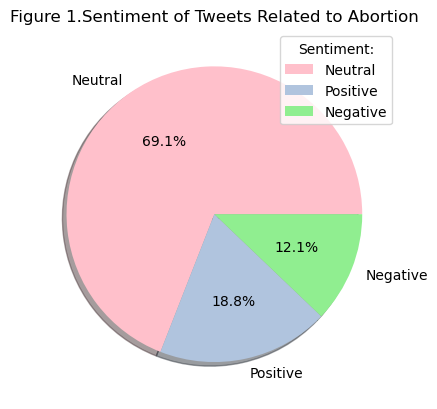

neutral     2071
positive     564
negative     364
Name: Sentiment, dtype: int64

In [10]:
my_colors = ['pink','lightsteelblue','lightgreen']
my_labels = ['Neutral','Positive','Negative']

plt.pie(annotated_abortion_tweets['Sentiment'].value_counts(),labels= my_labels,autopct='%1.1f%%', colors=my_colors, shadow=True)
plt.title("Figure 1.Sentiment of Tweets Related to Abortion")
plt.legend(title = "Sentiment:")
plt.show()
annotated_abortion_tweets['Sentiment'].value_counts()

In [11]:
plt.savefig("Figure 1.Sentiment of Tweets Related to Abortion.png")

<Figure size 640x480 with 0 Axes>

### Preprocessing

In [12]:
import re

In [13]:
annotated_abortion_tweets['Tweet'] = [token.lower() for token in annotated_abortion_tweets['Tweet']]
annotated_abortion_tweets.head(10)

,number,date,id,Tweet,Sentiment
0,1,2021-10-06 11:44:39+00:00,1.445717e+18,kürtaj konusunda kararım net. muhafazakarlarla...,positive
1,2,2013-03-30 08:12:17+00:00,3.179122e+17,@lilagracerose neden kürtaj ve son çaremi,neutral
2,3,2019-09-10 14:16:41+00:00,1.171427e+18,bilime de el attılar!!!\n\ni̇stanbul i̇l emniy...,neutral
3,4,2012-06-02 11:52:08+00:00,2.088887e+17,#radikal kürtaj protestosu bariyeri aştı: başb...,neutral
4,5,2018-05-12 18:29:54+00:00,9.953705e+17,@naptintugay kürtaj yapılıyeah,neutral
5,6,2021-03-18 18:47:42+00:00,1.372621e+18,nedc gibi merkezler tüp bebek tedavisi sonucun...,neutral
6,7,2016-04-06 06:51:45+00:00,7.176057e+17,‘yasa dışı kürtaj’ soruşturmasında i̇stanbul a...,neutral
7,8,2012-11-11 21:53:11+00:00,2.677468e+17,"tüm gereksiz insanlar doğmuş, bu saatten sonra...",neutral
8,9,2013-11-21 11:06:40+00:00,4.034796e+17,kürtaj\nkürtaj isteyen kadınlar genellikle bun...,neutral
9,10,2012-05-26 12:29:19+00:00,2.063614e+17,sezaryan-kürtaj-cinayet-uludere- bu nasıl bir ...,positive


In [14]:
found = annotated_abortion_tweets[annotated_abortion_tweets['Tweet'].str.contains('\n')]
found.count()

number       459
date         459
id           459
Tweet        459
Sentiment    459
dtype: int64

In [15]:
annotated_abortion_tweets['Tweet'] = annotated_abortion_tweets['Tweet'].replace('\n', '', regex=True)
found = annotated_abortion_tweets[annotated_abortion_tweets['Tweet'].str.contains('\n')]
found.count()

number       0
date         0
id           0
Tweet        0
Sentiment    0
dtype: int64

In [16]:
found = annotated_abortion_tweets[annotated_abortion_tweets['Tweet'].str.contains('@')]
found.count()

number       896
date         896
id           896
Tweet        896
Sentiment    896
dtype: int64

In [17]:
annotated_abortion_tweets['Tweet'] = annotated_abortion_tweets['Tweet'].replace('@[A-Za-z0-9_]+', '', regex=True).replace('@[A-Za-z0-9_]', '', regex=True)
found = annotated_abortion_tweets[annotated_abortion_tweets['Tweet'].str.contains('@')]
found.count()

number       1
date         1
id           1
Tweet        1
Sentiment    1
dtype: int64

In [18]:
annotated_abortion_tweets[annotated_abortion_tweets['Tweet'].str.contains('@')]

,number,date,id,Tweet,Sentiment
1379,1380,2016-01-23 02:01:30+00:00,6.907160e+17,aşk'ın kürtaj ı yok sevgili.bakamayacağın baka...,neutral


In [19]:
annotated_abortion_tweets['Tweet'] = annotated_abortion_tweets['Tweet'].replace('@', '', regex=True)
found = annotated_abortion_tweets[annotated_abortion_tweets['Tweet'].str.contains('@')]
found.count()

number       0
date         0
id           0
Tweet        0
Sentiment    0
dtype: int64

In [20]:
annotated_abortion_tweets['Tweet'] = annotated_abortion_tweets['Tweet'].replace(r'http\S+', '', regex=True).replace(r'www\S+', '', regex=True)
found = annotated_abortion_tweets[annotated_abortion_tweets['Tweet'].str.contains('http')]
found.count()

number       0
date         0
id           0
Tweet        0
Sentiment    0
dtype: int64

In [21]:
annotated_abortion_tweets.head(10)

,number,date,id,Tweet,Sentiment
0,1,2021-10-06 11:44:39+00:00,1.445717e+18,kürtaj konusunda kararım net. muhafazakarlarla...,positive
1,2,2013-03-30 08:12:17+00:00,3.179122e+17,neden kürtaj ve son çaremi,neutral
2,3,2019-09-10 14:16:41+00:00,1.171427e+18,bilime de el attılar!!!i̇stanbul i̇l emniyet m...,neutral
3,4,2012-06-02 11:52:08+00:00,2.088887e+17,#radikal kürtaj protestosu bariyeri aştı: başb...,neutral
4,5,2018-05-12 18:29:54+00:00,9.953705e+17,kürtaj yapılıyeah,neutral
5,6,2021-03-18 18:47:42+00:00,1.372621e+18,nedc gibi merkezler tüp bebek tedavisi sonucun...,neutral
6,7,2016-04-06 06:51:45+00:00,7.176057e+17,‘yasa dışı kürtaj’ soruşturmasında i̇stanbul a...,neutral
7,8,2012-11-11 21:53:11+00:00,2.677468e+17,"tüm gereksiz insanlar doğmuş, bu saatten sonra...",neutral
8,9,2013-11-21 11:06:40+00:00,4.034796e+17,kürtajkürtaj isteyen kadınlar genellikle bunu ...,neutral
9,10,2012-05-26 12:29:19+00:00,2.063614e+17,sezaryan-kürtaj-cinayet-uludere- bu nasıl bir ...,positive


### Removing Punctuations, Emojis and Numbers


In [22]:
import string

In [23]:
sentences = annotated_abortion_tweets['Tweet'].copy()
new_sent = []
i = 0
for sentence in sentences:
    new_sentence = re.sub('[0-9]+', '', sentence)
    new_sent.append(new_sentence)
    i += 1
    
annotated_abortion_tweets['Tweet'] = new_sent
annotated_abortion_tweets

,number,date,id,Tweet,Sentiment
0,1,2021-10-06 11:44:39+00:00,1.445717e+18,kürtaj konusunda kararım net. muhafazakarlarla...,positive
1,2,2013-03-30 08:12:17+00:00,3.179122e+17,neden kürtaj ve son çaremi,neutral
2,3,2019-09-10 14:16:41+00:00,1.171427e+18,bilime de el attılar!!!i̇stanbul i̇l emniyet m...,neutral
3,4,2012-06-02 11:52:08+00:00,2.088887e+17,#radikal kürtaj protestosu bariyeri aştı: başb...,neutral
4,5,2018-05-12 18:29:54+00:00,9.953705e+17,kürtaj yapılıyeah,neutral
...,...,...,...,...,...
2995,2996,2020-07-26 12:09:35+00:00,1.287359e+18,kürtaj hak filan değildir.. evet senin bedenin...,negative
2996,2997,2020-05-27 02:35:52+00:00,1.265472e+18,bah vallahi ararın biz burda kürtaj yapıyoz.,neutral
2997,2998,2013-06-04 08:29:50+00:00,3.418342e+17,bi kere ben akpli değilim. ama alkol yasağı k...,neutral
2998,2999,2013-11-04 16:06:28+00:00,3.973944e+17,hep aynı sözde rte'yi arkadan toplama taktikle...,neutral


In [24]:
table = str.maketrans('', '', string.punctuation)
sentences = annotated_abortion_tweets['Tweet'].copy()
new_sent = []
for sentence in sentences:
    words = sentence.split()
    stripped = [w.translate(table) for w in words]
    new_sent.append(stripped)

In [25]:
annotated_abortion_tweets['Tweet'] = new_sent
annotated_abortion_tweets

,number,date,id,Tweet,Sentiment
0,1,2021-10-06 11:44:39+00:00,1.445717e+18,"[kürtaj, konusunda, kararım, net, muhafazakarl...",positive
1,2,2013-03-30 08:12:17+00:00,3.179122e+17,"[neden, kürtaj, ve, son, çaremi]",neutral
2,3,2019-09-10 14:16:41+00:00,1.171427e+18,"[bilime, de, el, attılari̇stanbul, i̇l, emniye...",neutral
3,4,2012-06-02 11:52:08+00:00,2.088887e+17,"[radikal, kürtaj, protestosu, bariyeri, aştı, ...",neutral
4,5,2018-05-12 18:29:54+00:00,9.953705e+17,"[kürtaj, yapılıyeah]",neutral
...,...,...,...,...,...
2995,2996,2020-07-26 12:09:35+00:00,1.287359e+18,"[kürtaj, hak, filan, değildir, evet, senin, be...",negative
2996,2997,2020-05-27 02:35:52+00:00,1.265472e+18,"[bah, vallahi, ararın, biz, burda, kürtaj, yap...",neutral
2997,2998,2013-06-04 08:29:50+00:00,3.418342e+17,"[bi, kere, ben, akpli, değilim, ama, alkol, ya...",neutral
2998,2999,2013-11-04 16:06:28+00:00,3.973944e+17,"[hep, aynı, sözde, rteyi, arkadan, toplama, ta...",neutral


### Tokenization

In [26]:
!pip install antlr4-python3-runtime==4.8


[notice] A new release of pip available: 22.3 -> 22.3.1
[notice] To update, run: pip install --upgrade pip


In [27]:
import time
import logging
import sys

from zemberek import (
    TurkishSpellChecker,
    TurkishSentenceNormalizer,
    TurkishSentenceExtractor,
    TurkishMorphology,
    TurkishTokenizer
)

logger = logging.getLogger(__name__)

morphology = TurkishMorphology.create_with_defaults()
normalizer = TurkishSentenceNormalizer(morphology)
extractor = TurkishSentenceExtractor()

2023-01-17 16:44:06,669 - zemberek.morphology.turkish_morphology - INFO
Msg: TurkishMorphology instance initialized in 5.938215970993042



### Normalization

In [28]:
def normalize_long_text(text):
    normalized_sentences = [normalizer.normalize(word) for word in text]
    normalized_text = " ".join(normalized_sentences)
    return normalized_text

In [29]:
sentences = annotated_abortion_tweets['Tweet'].copy()
new_sent = []
start = time.time()

for token in sentences:   
    if token.count('') > 0:
        token = list(filter(('').__ne__, token))
    new_token = normalize_long_text(token)
    new_sent.append(new_token)

logger.info(f"Sentences normalized in: {time.time() - start} s")

2023-01-17 16:46:46,983 - __main__ - INFO
Msg: Sentences normalized in: 153.32213711738586 s



### Stopwords

In [30]:
from nltk.corpus import stopwords


stops = set(stopwords.words('turkish'))
print(stops)

{'ya', 'belki', 'siz', 'mü', 'da', 'her', 'birşey', 'mu', 'hep', 'birkaç', 'ne', 'eğer', 'neden', 'en', 'çok', 've', 'gibi', 'çünkü', 'tüm', 'bazı', 'ki', 'mı', 'niye', 'kim', 'ama', 'diye', 'sanki', 'ise', 'ile', 'biri', 'kez', 'nerede', 'de', 'biz', 'yani', 'nerde', 'acaba', 'hepsi', 'nasıl', 'aslında', 'nereye', 'şu', 'hiç', 'o', 'az', 'veya', 'şey', 'hem', 'daha', 'için', 'defa', 'niçin', 'bu'}


In [31]:
splitted_words = []
for sent in new_sent:
    words = sent.split()
    splitted_words.append(words)

In [32]:
clean_sent = []
for sentence in splitted_words:
    new_sentence = [w for w in sentence if w not in stops]
    clean_sent.append(new_sentence)

### Lemmatization

In [33]:
pip install zeyrek

Note: you may need to restart the kernel to use updated packages.


In [34]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/berrakarayel/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [35]:
for token in clean_sent:
    j = 0
    for word in token:
        new_word = word.replace('"', '').replace("’", '').replace("'", '').replace("”", '')
        token[j] = new_word
        j += 1

In [36]:
import zeyrek


analyzer = zeyrek.MorphAnalyzer()
lem_sent = []
for sent in clean_sent:
    normalized_sent = []
    for word in sent:
        if word == '':
            continue
        else:
            lem_word = analyzer.lemmatize(word)
            normalized_sent.append(lem_word[0][1][0])
    lem_sent.append(normalized_sent)

2023-01-17 16:47:55,644 - root - WARNING
Msg: APPENDING RESULT: <(kürtaj_Noun)(-)(kürtaj:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-17 16:47:55,647 - root - WARNING
Msg: APPENDING RESULT: <(konu_Noun)(-)(konu:noun_S + a3sg_S + su:p3sg_S + nda:loc_ST)>

2023-01-17 16:47:55,650 - root - WARNING
Msg: APPENDING RESULT: <(karmak_Verb)(-)(kar:verbRoot_S + ar:vAor_S + ım:vA1sg_ST)>

2023-01-17 16:47:55,650 - root - WARNING
Msg: APPENDING RESULT: <(karamak_Verb)(-)(kara:verbRoot_S + r:vAor_S + ım:vA1sg_ST)>

2023-01-17 16:47:55,651 - root - WARNING
Msg: APPENDING RESULT: <(karar_Noun)(-)(karar:noun_S + a3sg_S + ım:p1sg_S + nom_ST)>

2023-01-17 16:47:55,653 - root - WARNING
Msg: APPENDING RESULT: <(karar_Noun)(-)(karar:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ım:nA1sg_ST)>

2023-01-17 16:47:55,654 - root - WARNING
Msg: APPENDING RESULT: <(net_Adj)(-)(net:adjectiveRoot_ST)>

2023-01-17 16:47:55,655 - root - WARNING
Msg: APPENDING RESULT: <(net_Noun)(-)(net:n

In [38]:
x = lem_sent.copy()
for sent in x:
    i = 0
    for token in sent:
        sent[i] = token.lower()
        i += 1
lem_sent = x

In [39]:
lem_sent = list(filter(('').__ne__, lem_sent))

In [40]:
annotated_abortion_tweets['Tweet'] = lem_sent
annotated_abortion_tweets['Tweet'].head(5)

0    [kürtaj, konu, karamak, net, muhafazakâr, aynı...
1                                  [kürtaj, son, çare]
2    [bilim, demek, el, attıları̇stanbul, i̇l, emni...
3    [radikal, kürtaj, protesto, bariyer, aşti, baş...
4                                 [kürtaj, yapiliyeah]
Name: Tweet, dtype: object

In [ ]:
annotated_abortion_tweets['Tweet'] = annotated_abortion_tweets.Tweet.apply(' '.join)

In [ ]:
annotated_abortion_tweets.to_csv(r'abortion annotation preprocessedupdated.csv')